In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
base_skin_dir = '../data/HAM10000'

In [3]:
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'dermatofibroma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [4]:
tile_df = pd.read_csv(os.path.join(base_skin_dir, 'HAM10000_metadata.csv'))
tile_df['path'] = tile_df['image_id'].map(imageid_path_dict.get)
tile_df['cell_type'] = tile_df['dx'].map(lesion_type_dict.get) 
tile_df['cell_type_idx'] = pd.Categorical(tile_df['cell_type']).codes
tile_df.sample(3)

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
7741,HAM_0001943,ISIC_0025769,nv,histo,30.0,female,lower extremity,../data/HAM10000\Images\ISIC_0025769.jpg,Melanocytic nevi,4
1746,HAM_0003495,ISIC_0033524,mel,histo,85.0,male,back,../data/HAM10000\Images\ISIC_0033524.jpg,dermatofibroma,6
5616,HAM_0006021,ISIC_0026881,nv,follow_up,50.0,female,back,../data/HAM10000\Images\ISIC_0026881.jpg,Melanocytic nevi,4


In [5]:
tile_df.describe(exclude=[np.number])

,lesion_id,image_id,dx,dx_type,sex,localization,path,cell_type
count,10015,10015,10015,10015,10015,10015,10015,10015
unique,7470,10015,7,4,3,15,10015,7
top,HAM_0005263,ISIC_0027918,nv,histo,male,back,../data/HAM10000\Images\ISIC_0025363.jpg,Melanocytic nevi
freq,6,1,6705,5340,5406,2192,1,6705


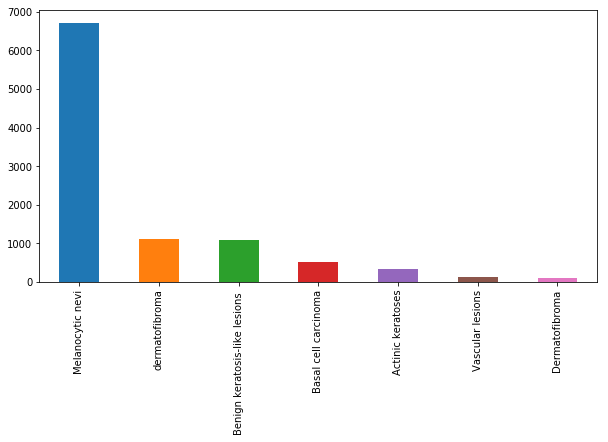

In [6]:
fig, ax1 = plt.subplots(1, 1, figsize = (10, 5))
tile_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)

In [8]:
# load in all of the images
from skimage.io import imread
tile_df['image'] = tile_df['path'].map(imread)

In [9]:
# see the image size distribution
tile_df['image'].map(lambda x: x.shape).value_counts()

(450, 600, 3)    10015
Name: image, dtype: int64

# Show off a few in each category

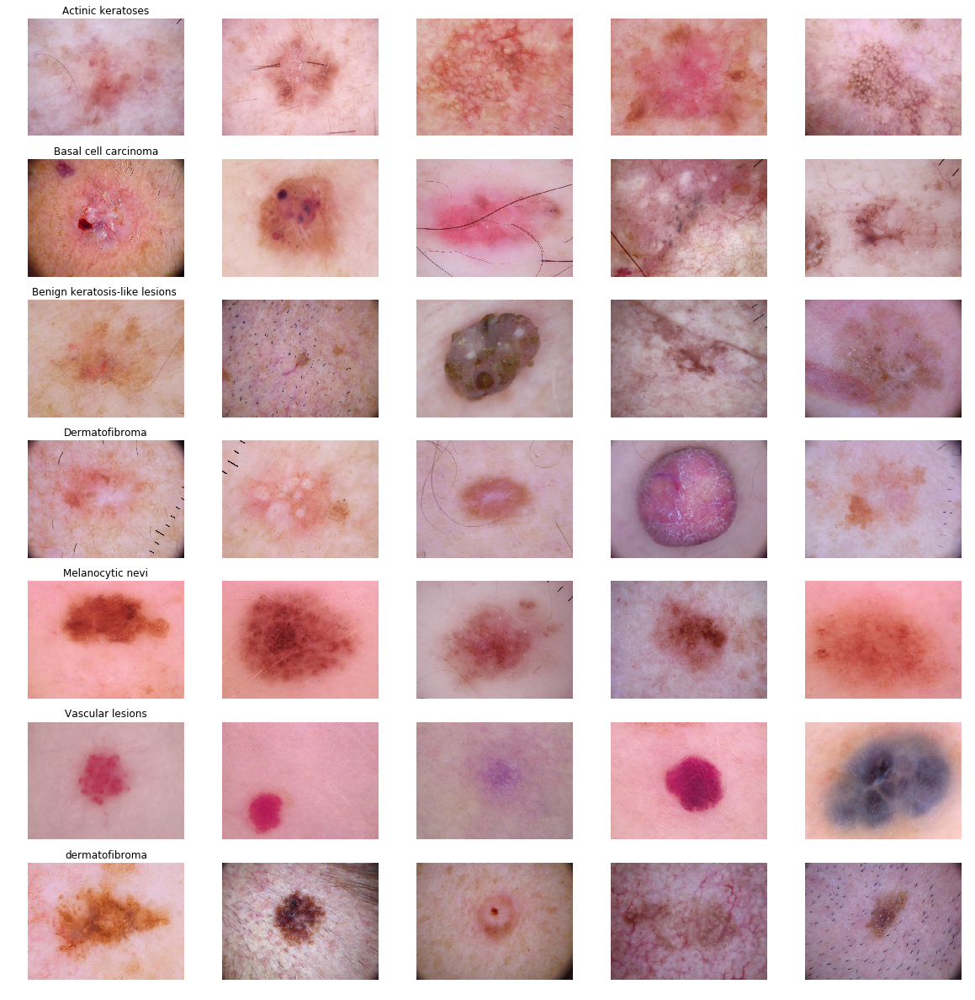

In [10]:
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         tile_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=2018).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

## Get Average Color Information
Here we get and normalize all of the color channel information

In [11]:
rgb_info_df = tile_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v in 
                                  zip(['Red', 'Green', 'Blue'], 
                                      np.mean(x['image'], (0, 1)))}),1)
gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec
rgb_info_df['Gray_mean'] = gray_col_vec
rgb_info_df.sample(3)

,Red_mean,Green_mean,Blue_mean,Gray_mean
1028,1.410718,0.718501,0.870780,148.639646
4210,1.413418,0.811515,0.775068,152.750937
4524,1.425985,0.779966,0.794049,143.264075


In [12]:
for c_col in rgb_info_df.columns:
    tile_df[c_col] = rgb_info_df[c_col].values # we cant afford a copy

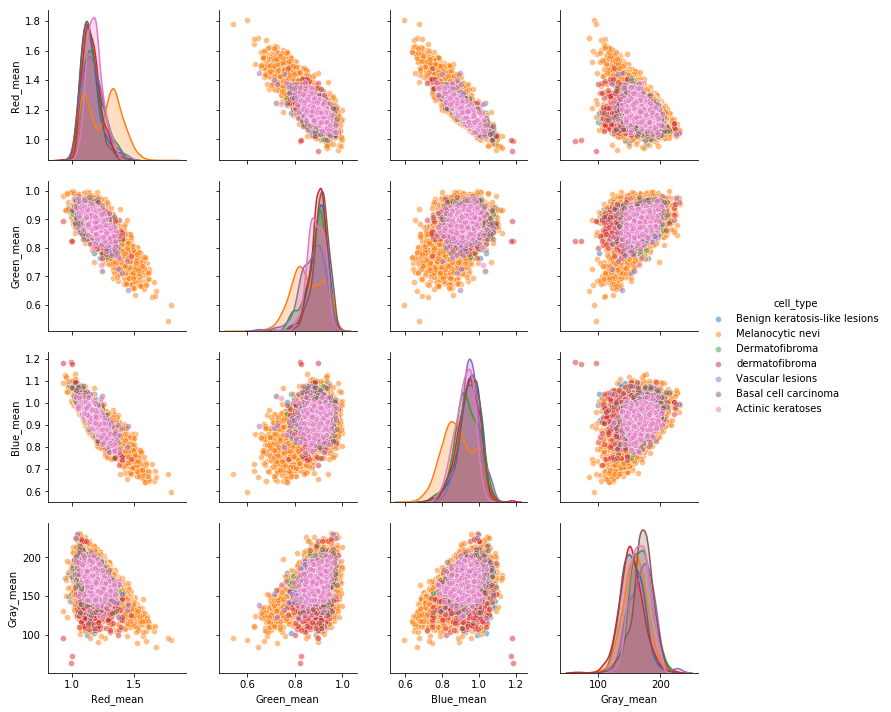

In [13]:
sns.pairplot(tile_df[['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean', 'cell_type']], 
             hue='cell_type', plot_kws = {'alpha': 0.5})

# Show Color Range
Show how the mean color channel values affect images

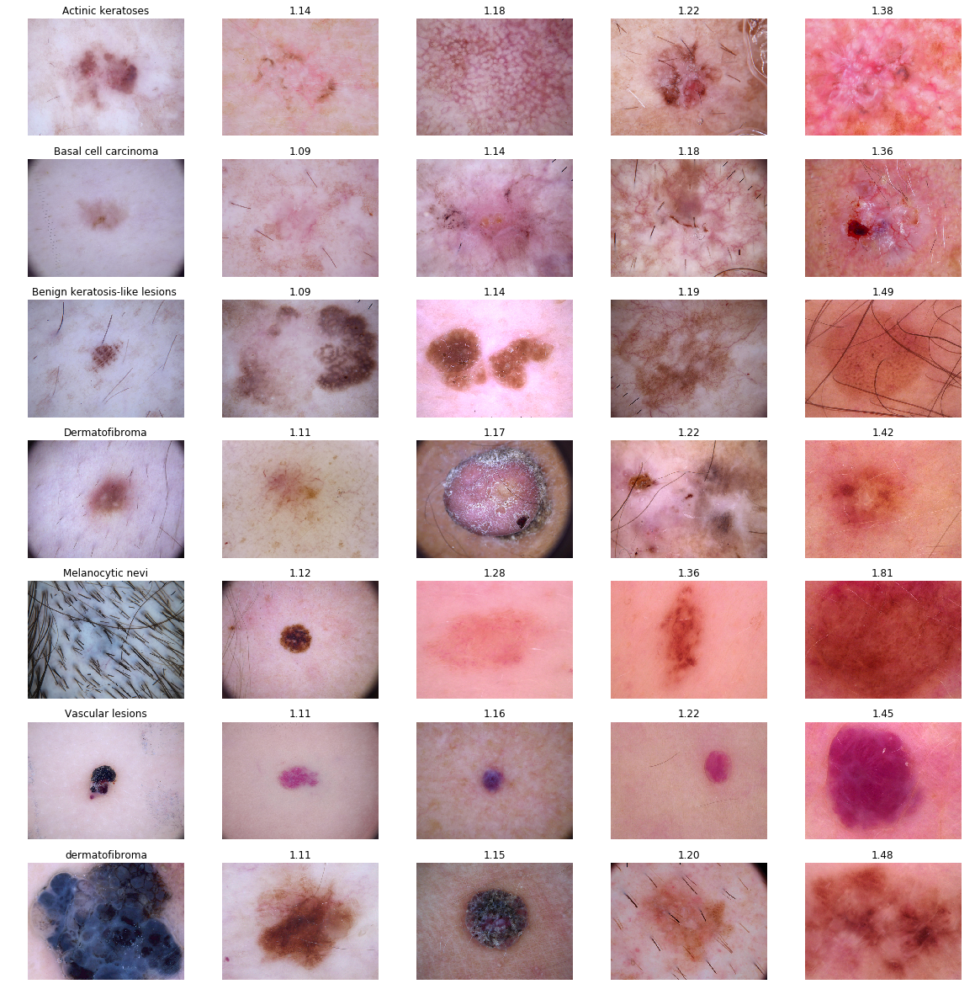

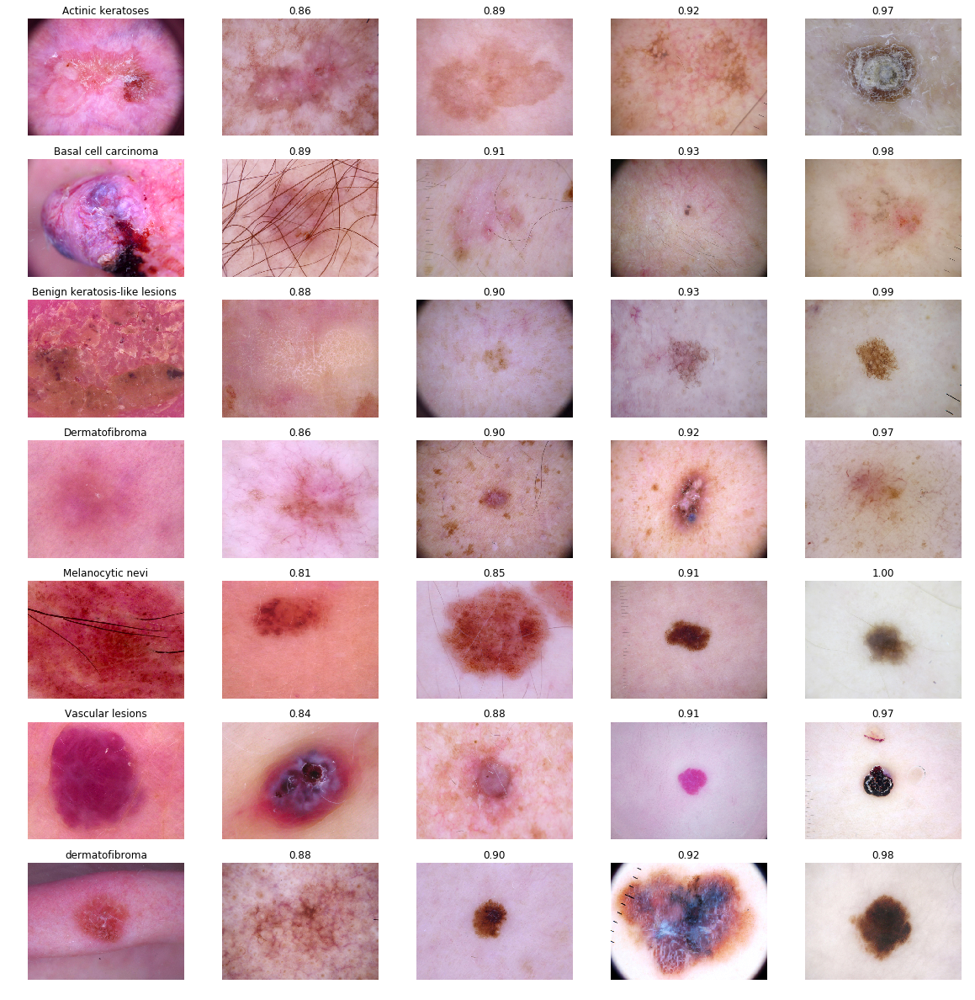

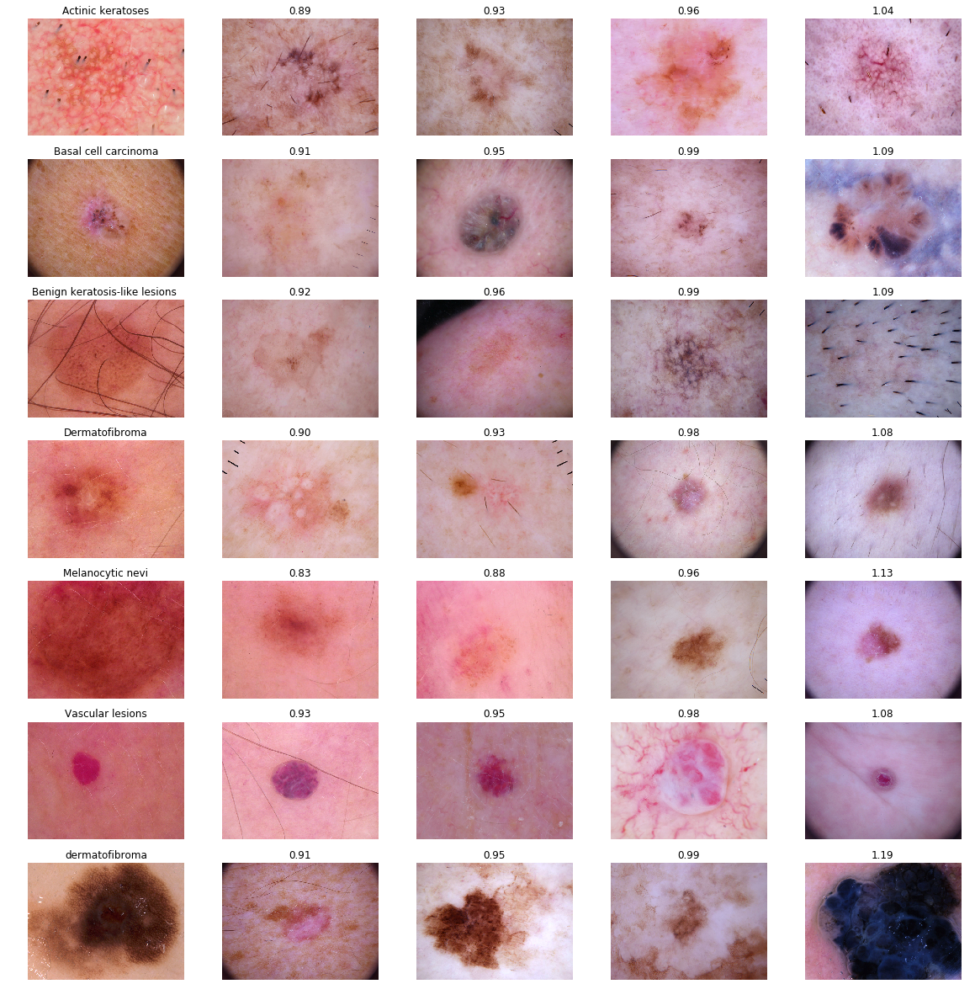

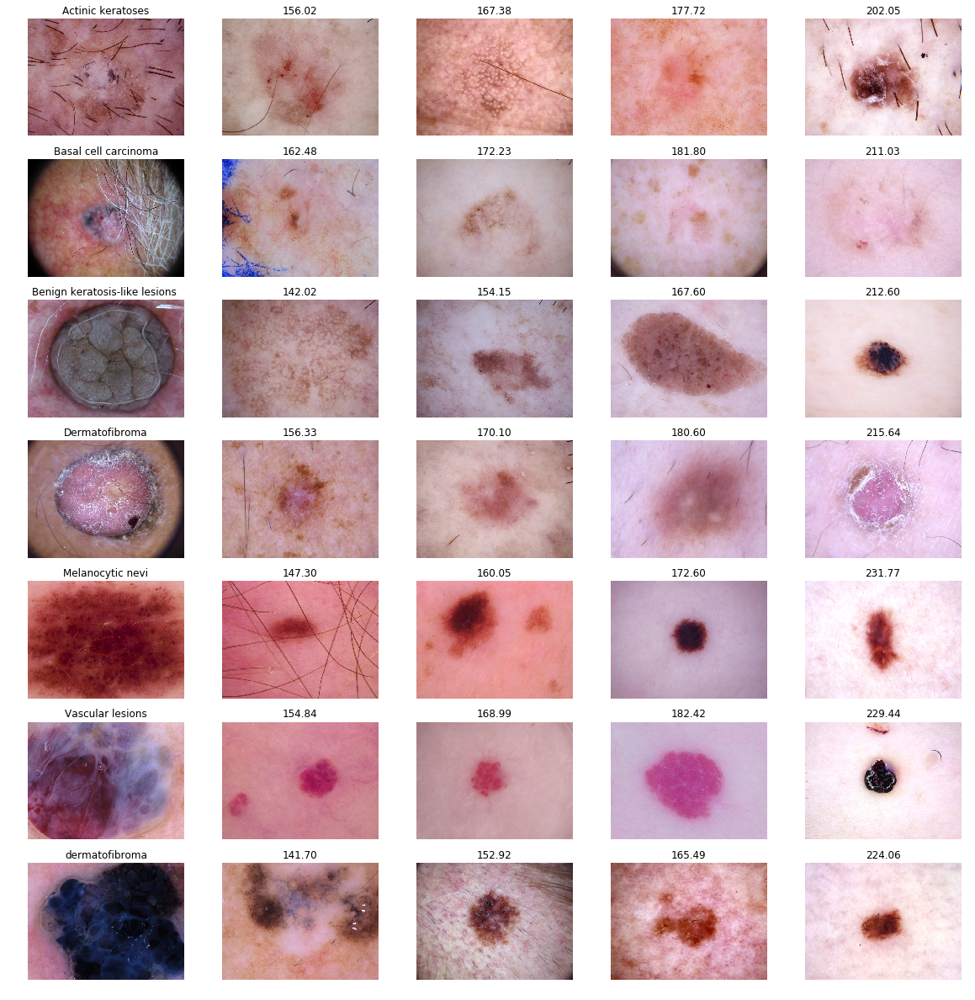

In [14]:
n_samples = 5
for sample_col in ['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean']:
    fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0]-1, n, dtype=int)
        return s_rows.iloc[s_idx]
    for n_axs, (type_name, type_rows) in zip(m_axs, 
                                             tile_df.sort_values(['cell_type']).groupby('cell_type')):

        for c_ax, (_, c_row) in zip(n_axs, 
                                    take_n_space(type_rows, 
                                                 sample_col,
                                                 n_samples).iterrows()):
            c_ax.imshow(c_row['image'])
            c_ax.axis('off')
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)
    fig.savefig('{}_samples.png'.format(sample_col), dpi=300)